### Fill mode in reflect

In [1]:
from keras.utils import img_to_array, load_img, array_to_img
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)

In [2]:
import tensorflow.keras as keras

In [3]:
img = load_img(r"C:\Users\mikun\Downloads\bmw.jpeg")

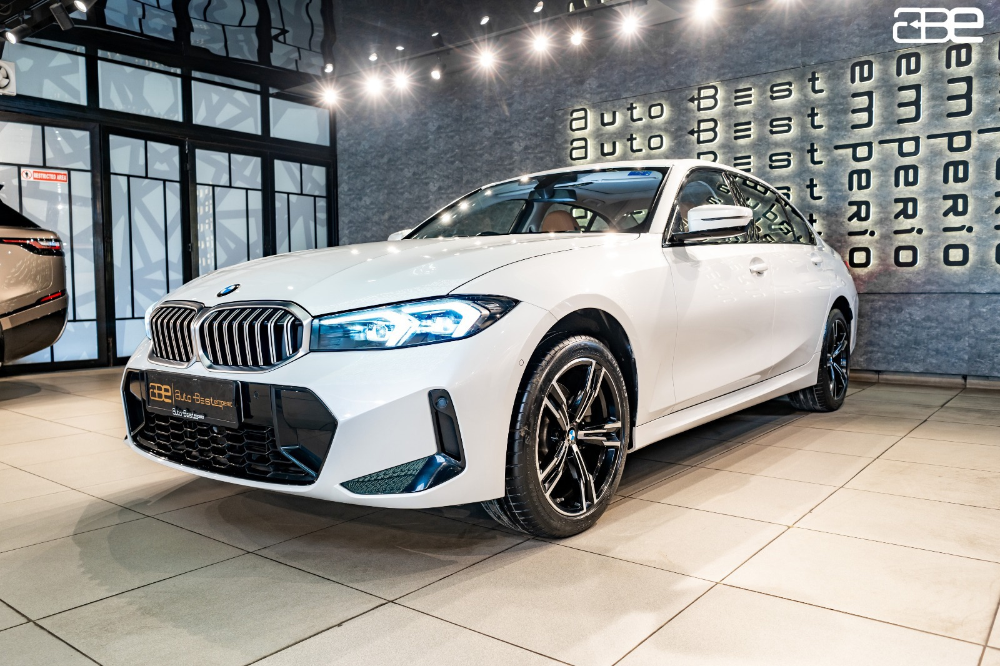

In [4]:
img

In [18]:
x = img_to_array(img) # converts image to array format
# x.shape = (1066, 1600, 3)
x = x.reshape((1,) + x.shape) # It converts the shape into (1, 1066, 1600, 3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


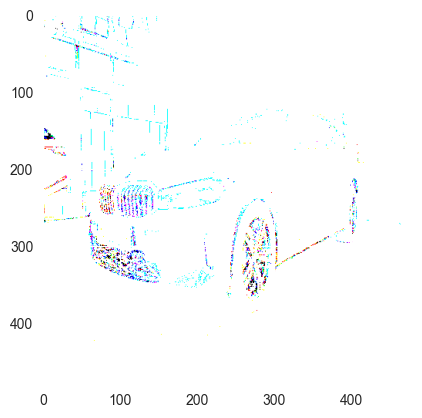

In [50]:
import matplotlib.pyplot as plt

plt.imshow(img_to_array(img))

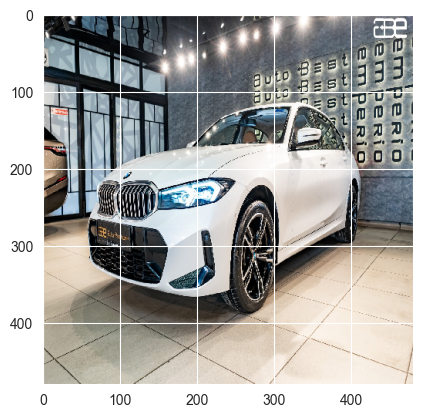

In [53]:
temp_x = img_to_array(img)
plt.imshow(array_to_img(temp_x))

In [20]:
i = 0
for batch in datagen.flow(x, batch_size=1, save_to_dir=r"D:\Mikun\All Learnings\Data Science PyCharm\CNN\data arguments", save_prefix="car", save_format="jpeg"):
    i += 1
    if i > 30:
        break

In [22]:
datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="reflect"
)

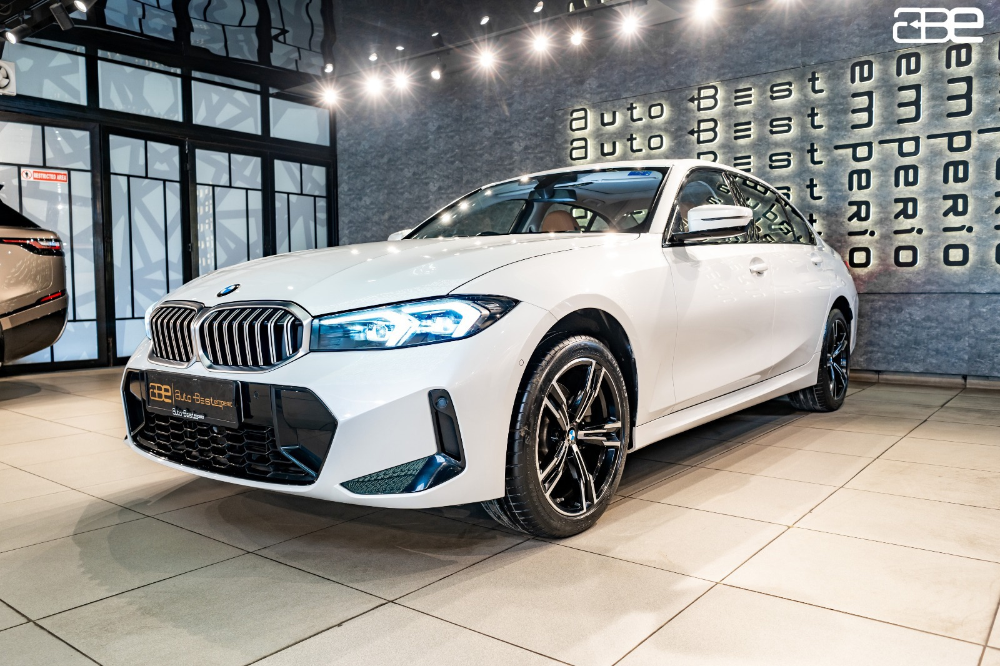

In [23]:
img

In [26]:
i= 0
for batch in datagen.flow(x, batch_size=1,
                          save_to_dir=r'D:\Mikun\All Learnings\Data Science PyCharm\CNN\data arguments 2', save_prefix="car", save_format='jpeg'):
    i += 1
    if i > 30:
        break

In [27]:
keras.applications.ResNet50(
    include_top=True,
    weights="imagenet",
    input_tensor=None,
    input_shape=None,
    pooling=None,
    classes=1000,
    classifier_activation="softmax"
)

102967424/102967424 ━━━━━━━━━━━━━━━━━━━━ 29s 0us/step


<Functional name=resnet50, built=True>

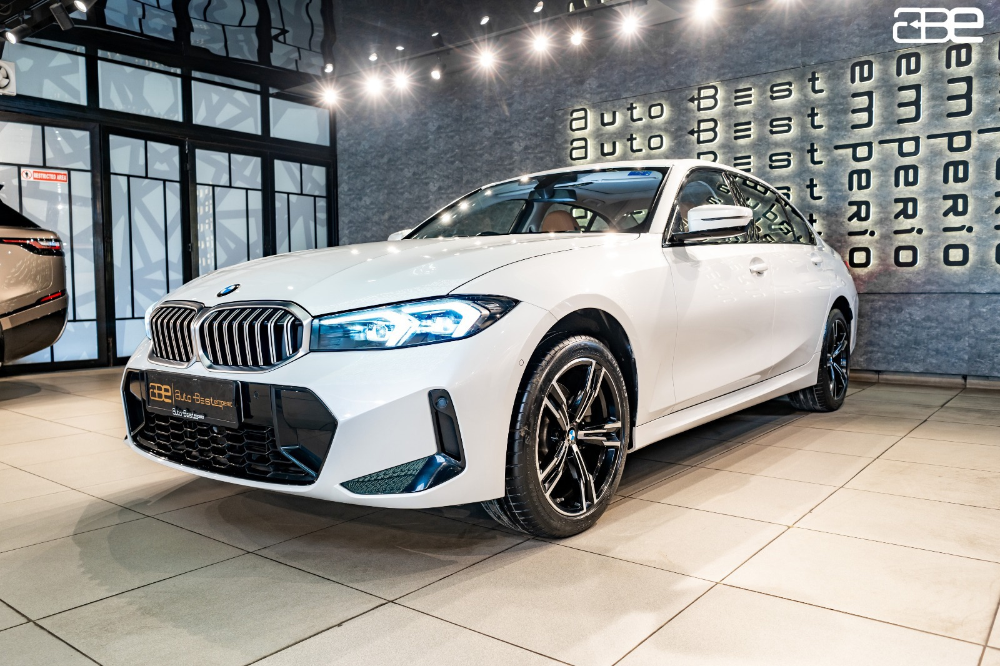

In [28]:
from keras.utils import array_to_img, img_to_array, load_img
img =  load_img(r"C:\Users\mikun\Downloads\bmw.jpeg")
img

In [29]:
import numpy as np
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image

# Load the ResNet-50 model pre-trained on ImageNet data
model = ResNet50(weights="imagenet")

# Load and preprocess the input image
img = image.load_img(r"C:\Users\mikun\Downloads\bmw.jpeg", target_size=(224, 224))
img_array = image.img_to_array(img)

In [30]:
img_array = np.expand_dims(img_array, axis=0)
img_array = preprocess_input(img_array)

# Make predictions
predictions = model.predict(img_array)

# Decode and print the prediction
decoded_prediction = decode_predictions(predictions, top=5)[0]

print("Predictions:")
for i, (image_id, label, score) in enumerate(decoded_prediction):
    print(f"{i + 1}: {label} ({score:.2f})")

# Optionally, you can obtain the class index for the top prediction
top_class_index = np.argmax(predictions[0])
print(f"\nTop Prediction Class Index: {top_class_index}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
35363/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 1us/step
Predictions:
1: sports_car (0.25)
2: convertible (0.18)
3: limousine (0.17)
4: car_wheel (0.12)
5: racer (0.10)

Top Prediction Class Index: 817


### ResNet50V2

In [31]:
import numpy as np
from tensorflow.keras.applications.resnet_v2 import ResNet50V2, preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image

# Load the ResNet50V2 model pre-trained on Image Net data
model = ResNet50V2(weights="imagenet")

# Load and preprocess the input image
img_array = image.load_img(r"C:\Users\mikun\Downloads\bmw.jpeg", target_size=(224, 224))

img_array = image.img_to_array(img_array)
img_array = np.expand_dims(img_array, axis=0)
img_array = preprocess_input(img_array)
img_array

102869336/102869336 ━━━━━━━━━━━━━━━━━━━━ 19s 0us/step


array([[[[-0.9529412 , -0.9372549 , -0.94509804],
         [-0.9764706 , -0.96862745, -0.9529412 ],
         [-0.90588236, -0.90588236, -0.8901961 ],
         ...,
         [-0.01176471,  0.01176476,  0.14509809],
         [-0.02745098, -0.01960784,  0.12156868],
         [-0.19215685, -0.18431371, -0.04313725]],

        [[-0.62352943, -0.654902  , -0.6627451 ],
         [-0.8509804 , -0.8509804 , -0.8666667 ],
         [-0.8509804 , -0.8509804 , -0.8509804 ],
         ...,
         [-0.06666666, -0.04313725,  0.09019613],
         [-0.23137254, -0.21568626, -0.05098039],
         [-0.23921567, -0.23137254, -0.06666666]],

        [[-0.92941177, -0.9372549 , -0.9529412 ],
         [-0.9137255 , -0.9137255 , -0.92941177],
         [-0.8352941 , -0.8352941 , -0.8509804 ],
         ...,
         [-0.2235294 , -0.19999999, -0.05098039],
         [-0.17647058, -0.1372549 ,  0.03529418],
         [-0.18431371, -0.16862744, -0.00392157]],

        ...,

        [[ 0.4039216 ,  0.3803922 ,  0

In [34]:
predictions = model.predict(img_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


In [42]:
# Decode and print the predicted classes
decoded_prediction = decode_predictions(predictions, top=5)[0]

print("Predictions:")
for i, (image_id, label, score) in enumerate(decoded_prediction):
    print(f"{i + 1}: {label} ({score:.2f}")

# Optionally, you can obtain the class index for the top prediction
top_class_index = np.argmax(predictions[0])
print(f"\n Top Prediction Class Index: {top_class_index}")

Predictions:
1: sports_car (0.59
2: limousine (0.14
3: racer (0.07
4: car_wheel (0.07
5: grille (0.06

 Top Prediction Class Index: 817


### VGG16

In [44]:
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image

# Load the model
model = VGG16(weights="imagenet")

# Load the image and convert to array and preprocess
img_array = image.load_img(r"C:\Users\mikun\Downloads\bmw.jpeg", target_size=(224, 224))
img_array = image.img_to_array(img_array)
img_array = np.expand_dims(img_array, axis=0)
img_array = preprocess_input(img_array)

# Make Prediction
predictions = model.predict(img_array)

# Decode and print the top 3
decoded_prediction = decode_predictions(predictions, top=3)[0]

print("The Prediction are:")
for i, (image_id, label, score) in enumerate(decoded_prediction):
    print(f"{i+1} : {label} : {score:.2f}")

# Class index for the top prediction
top_class_index = np.argmax(predictions[0])
print(f"\n Top prediction class Index: {top_class_index}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
The Prediction are:
1 : sports_car : 0.63
2 : racer : 0.17
3 : convertible : 0.11

 Top prediction class Index: 817


### ConvNeXtXLarge

In [46]:
from tensorflow.keras.applications.convnext import ConvNeXtXLarge, preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image

model = ConvNeXtXLarge(weights="imagenet")

img = image.load_img(r"C:\Users\mikun\Downloads\bmw.jpeg", target_size=(224, 224))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = preprocess_input(img_array)

# Predicting with ConvNetXtXLarge
predictions = model.predict(img_array)

# Decode the prediciton
decoded_prediction = decode_predictions(predictions, top=3)[0]

for i, (img_id, category, score) in enumerate(decoded_prediction):
    print(f"{i+1}: {category} : {score:.2f}")


# top prediction class index
top_class_index = np.argmax(predictions[0])
print(f"\n Top prediction class Index: {top_class_index}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1: grille : 0.79
2: convertible : 0.05
3: car_wheel : 0.04

 Top prediction class Index: 581


### EfficientNetV2

In [48]:
from tensorflow.keras.applications.efficientnet_v2 import EfficientNetV2L, preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image

model = EfficientNetV2L(weights="imagenet")

img = image.load_img(r"C:\Users\mikun\Downloads\bmw.jpeg", target_size=(480, 480))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = preprocess_input(img_array)

predictions = model.predict(img_array)

decoded_prediction = decode_predictions(predictions, top=3)[0]
for i, (img_id, category, score) in enumerate(decoded_prediction):
    print(f"{i+1}: {category} : {score:.2f}")

# max prediction class index
top_class_index = np.argmax(predictions[0])
print(f"\n Top prediction class Index: {top_class_index}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1: sports_car : 0.27
2: convertible : 0.14
3: grille : 0.12

 Top prediction class Index: 817


In [54]:
sad_face = r"C:\Users\mikun\Downloads\Gemini_Generated_Image_g5xljlg5xljlg5xl.png"

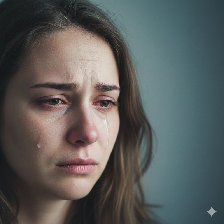

In [58]:
img = image.load_img(sad_face, target_size=(224, 224))
img

In [59]:
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image

# model loading
model = VGG16(weights="imagenet")

# image Preprocessing
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = preprocess_input(img_array)

# Prediction
predictions = model.predict(img_array)

# Decoding teh prediction
decoded_prediction = decode_predictions(predictions, top=3)[0]
for i, (img_id, category, score) in enumerate(decoded_prediction):
    print(f"{i+1}: {category} : {score:.2f}")

# top class index finding
top_class_index = np.argmax(predictions[0])
print(f"\n Top prediction class Index: {top_class_index}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step
1: brassiere : 0.28
2: bikini : 0.10
3: maillot : 0.07

 Top prediction class Index: 459
